# Midterm (1) Project: Spotify Hit Predictor. 
# Exploratory Data Analysis (EDA) and Machine Learning for Popularity Forecasting

### **Dataset: 30,000 Spotify Songs (Kaggle) link - https://www.kaggle.com/datasets/joebeachcapital/30000-spotify-songs?select=spotify_songs.csv**

Goal this mini project: Prediction songs popularity 
Objective: To build and evaluate predictive models that determine a song's popularity based on audio features and metadata.

### **Steps:**
    
    1. Show dataframe (EDA Part - 1)

    2. Data Cleaning 
    
    3. Visualization and Analysis (EDA Part - 2)
    
    4. Find coorelations and showing 
        - Heatmap
    
    5. Feature Engineering
        - Encoding 

    6. Encoding & (Don't make a Data Leakage)
        - Scaling 
        - Train/Test Split

    7. Creat multiple types of models
    
    9. Evaluation and Comparsion
    
    10. Conclution

## Step 0. Setup Dataframe and import libraries

In [108]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder, StandardScaler, OneHotEncoder, MinMaxScaler
from sklearn.model_selection import train_test_split


In [109]:
# visual settings 
sns.set(style='whitegrid')
plt.rcParams['figure.figsize'] = (10,6)

df = pd.read_csv('data/spotify_songs.csv')


## Step 1: Show Data Set.

In [110]:
df.head()

,track_id,track_name,track_artist,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_genre,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
0,6f807x0ima9a1j3VPbc7VN,I Don't Care (with Justin Bieber) - Loud Luxur...,Ed Sheeran,66,2oCs0DGTsRO98Gh5ZSl2Cx,I Don't Care (with Justin Bieber) [Loud Luxury...,2019-06-14,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,6,-2.634,1,0.0583,0.1020,0.000000,0.0653,0.518,122.036,194754
1,0r7CVbZTWZgbTCYdfa2P31,Memories - Dillon Francis Remix,Maroon 5,67,63rPSO264uRjW1X5E6cWv6,Memories (Dillon Francis Remix),2019-12-13,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,11,-4.969,1,0.0373,0.0724,0.004210,0.3570,0.693,99.972,162600
2,1z1Hg7Vb0AhHDiEmnDE79l,All the Time - Don Diablo Remix,Zara Larsson,70,1HoSmj2eLcsrR0vE9gThr4,All the Time (Don Diablo Remix),2019-07-05,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,1,-3.432,0,0.0742,0.0794,0.000023,0.1100,0.613,124.008,176616
3,75FpbthrwQmzHlBJLuGdC7,Call You Mine - Keanu Silva Remix,The Chainsmokers,60,1nqYsOef1yKKuGOVchbsk6,Call You Mine - The Remixes,2019-07-19,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,7,-3.778,1,0.1020,0.0287,0.000009,0.2040,0.277,121.956,169093
4,1e8PAfcKUYoKkxPhrHqw4x,Someone You Loved - Future Humans Remix,Lewis Capaldi,69,7m7vv9wlQ4i0LFuJiE2zsQ,Someone You Loved (Future Humans Remix),2019-03-05,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,1,-4.672,1,0.0359,0.0803,0.000000,0.0833,0.725,123.976,189052


In [111]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32833 entries, 0 to 32832
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   track_id                  32833 non-null  object 
 1   track_name                32828 non-null  object 
 2   track_artist              32828 non-null  object 
 3   track_popularity          32833 non-null  int64  
 4   track_album_id            32833 non-null  object 
 5   track_album_name          32828 non-null  object 
 6   track_album_release_date  32833 non-null  object 
 7   playlist_name             32833 non-null  object 
 8   playlist_id               32833 non-null  object 
 9   playlist_genre            32833 non-null  object 
 10  playlist_subgenre         32833 non-null  object 
 11  danceability              32833 non-null  float64
 12  energy                    32833 non-null  float64
 13  key                       32833 non-null  int64  
 14  loudne

In [112]:
# Show the sum of the empty values 
df.isnull().sum()

track_id                    0
track_name                  5
track_artist                5
track_popularity            0
track_album_id              0
track_album_name            5
track_album_release_date    0
playlist_name               0
playlist_id                 0
playlist_genre              0
playlist_subgenre           0
danceability                0
energy                      0
key                         0
loudness                    0
mode                        0
speechiness                 0
acousticness                0
instrumentalness            0
liveness                    0
valence                     0
tempo                       0
duration_ms                 0
dtype: int64

## Step 2: Cleaning Data Set

In [113]:
column_to_drop = ['track_name', 'track_artist', 'track_album_name']
df.dropna(subset=column_to_drop, inplace=True)
df.shape

(32828, 23)

In [114]:
# Checking
df.isnull().sum()

track_id                    0
track_name                  0
track_artist                0
track_popularity            0
track_album_id              0
track_album_name            0
track_album_release_date    0
playlist_name               0
playlist_id                 0
playlist_genre              0
playlist_subgenre           0
danceability                0
energy                      0
key                         0
loudness                    0
mode                        0
speechiness                 0
acousticness                0
instrumentalness            0
liveness                    0
valence                     0
tempo                       0
duration_ms                 0
dtype: int64

In [115]:
# Data Type Casting
df['track_album_release_date'] = pd.to_datetime(df['track_album_release_date'], errors='coerce') 

Showing Date Period

In [116]:
min_date = df['track_album_release_date'].min()
max_date = df['track_album_release_date'].max()

print(f"Date from {min_date} to {max_date}")

Date from 1957-01-01 00:00:00 to 2020-01-29 00:00:00


In [ ]:
cleaning_data = df[:]

## Step 3: Visualization and Analysis

### Outlier Handling 

In [117]:
df.describe()

,track_popularity,track_album_release_date,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
count,32828.000000,30942,32828.000000,32828.000000,32828.000000,32828.000000,32828.000000,32828.000000,32828.000000,32828.000000,32828.000000,32828.000000,32828.000000,32828.000000
mean,42.483551,2012-09-09 02:04:26.666666752,0.654850,0.698603,5.373949,-6.719529,0.565737,0.107053,0.175352,0.084760,0.190175,0.510556,120.883642,225796.829779
min,0.000000,1957-01-01 00:00:00,0.000000,0.000175,0.000000,-46.448000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4000.000000
25%,24.000000,2010-12-03 06:00:00,0.563000,0.581000,2.000000,-8.171250,0.000000,0.041000,0.015100,0.000000,0.092700,0.331000,99.961000,187804.500000
50%,45.000000,2017-01-27 00:00:00,0.672000,0.721000,6.000000,-6.166000,1.000000,0.062500,0.080400,0.000016,0.127000,0.512000,121.984000,216000.000000
75%,62.000000,2019-05-16 00:00:00,0.761000,0.840000,9.000000,-4.645000,1.000000,0.132000,0.255000,0.004830,0.248000,0.693000,133.918250,253581.250000
max,100.000000,2020-01-29 00:00:00,0.983000,1.000000,11.000000,1.275000,1.000000,0.918000,0.994000,0.994000,0.996000,0.991000,239.440000,517810.000000
std,24.980476,NaN,0.145092,0.180916,3.611572,2.988641,0.495667,0.101307,0.219644,0.224245,0.154313,0.233152,26.903632,59836.492346


<Axes: >

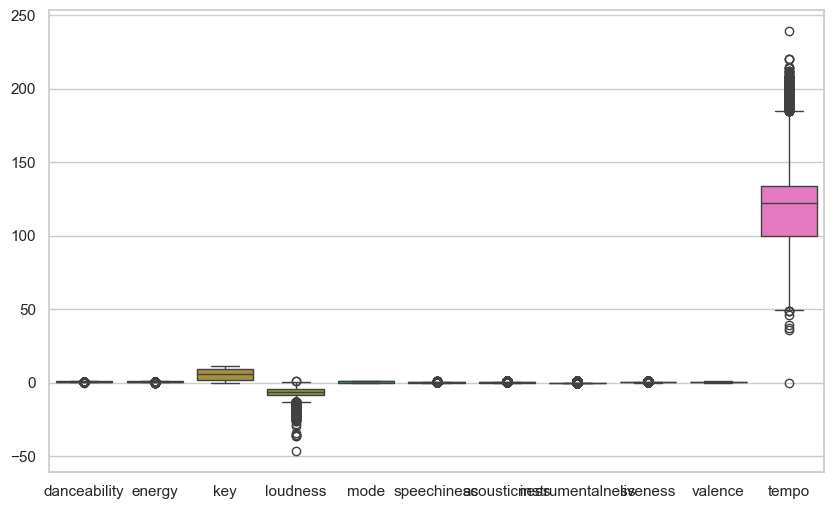

In [118]:
labels = ['danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms']
sns.boxplot(data=df[labels[:-1]])

<Axes: >

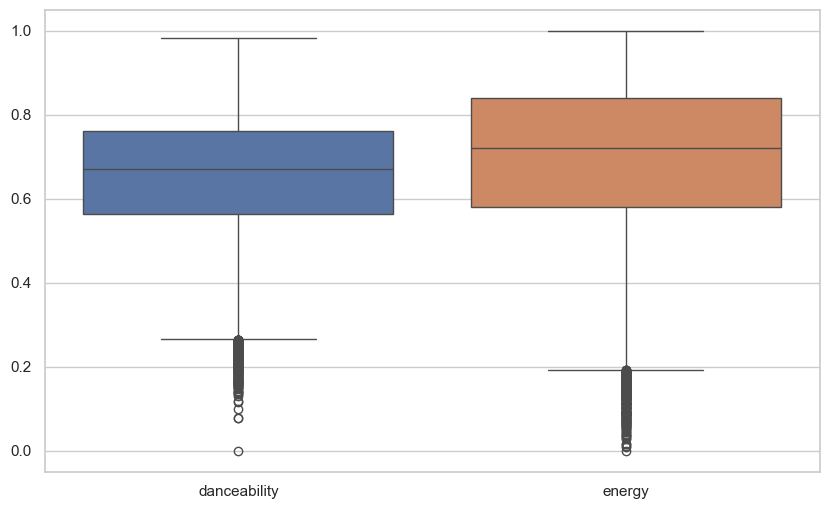

In [119]:
sns.boxplot(data=df[['danceability', 'energy']])

<Axes: >

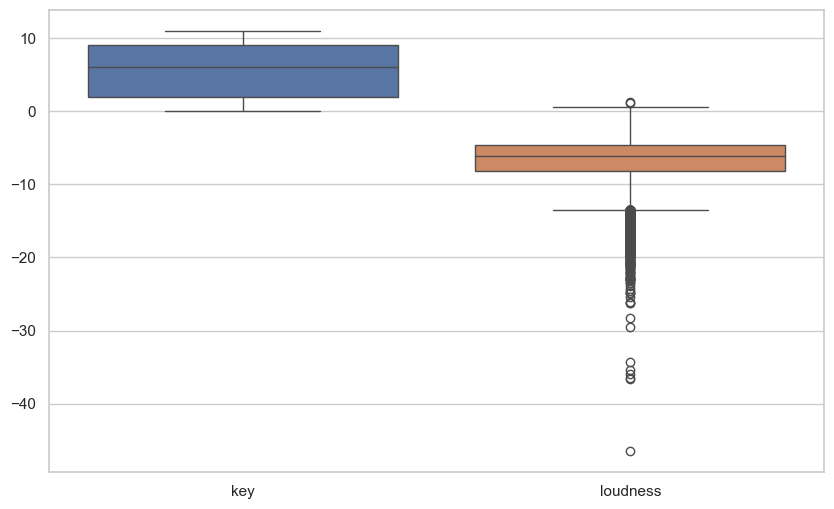

In [120]:
sns.boxplot(data=df[['key', 'loudness']])


<Axes: >

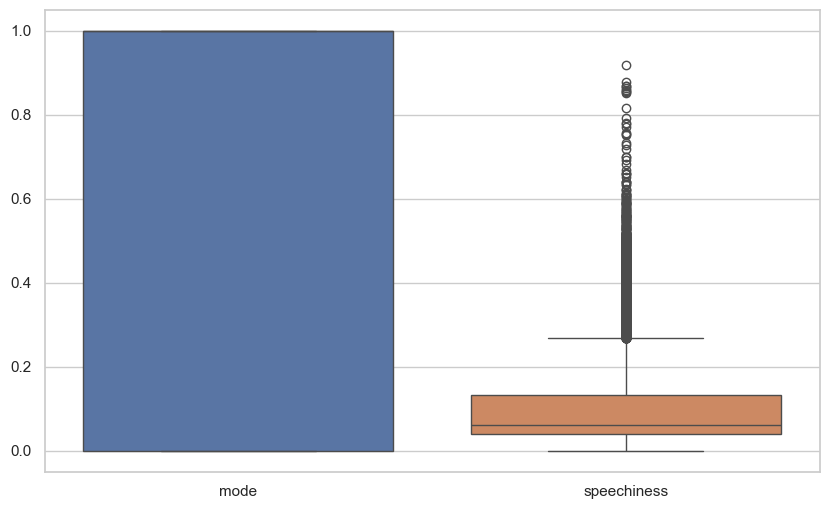

In [121]:
sns.boxplot(data=df[['mode', 'speechiness']])

In [122]:
df['playlist_genre'].unique()

array(['pop', 'rap', 'rock', 'latin', 'r&b', 'edm'], dtype=object)

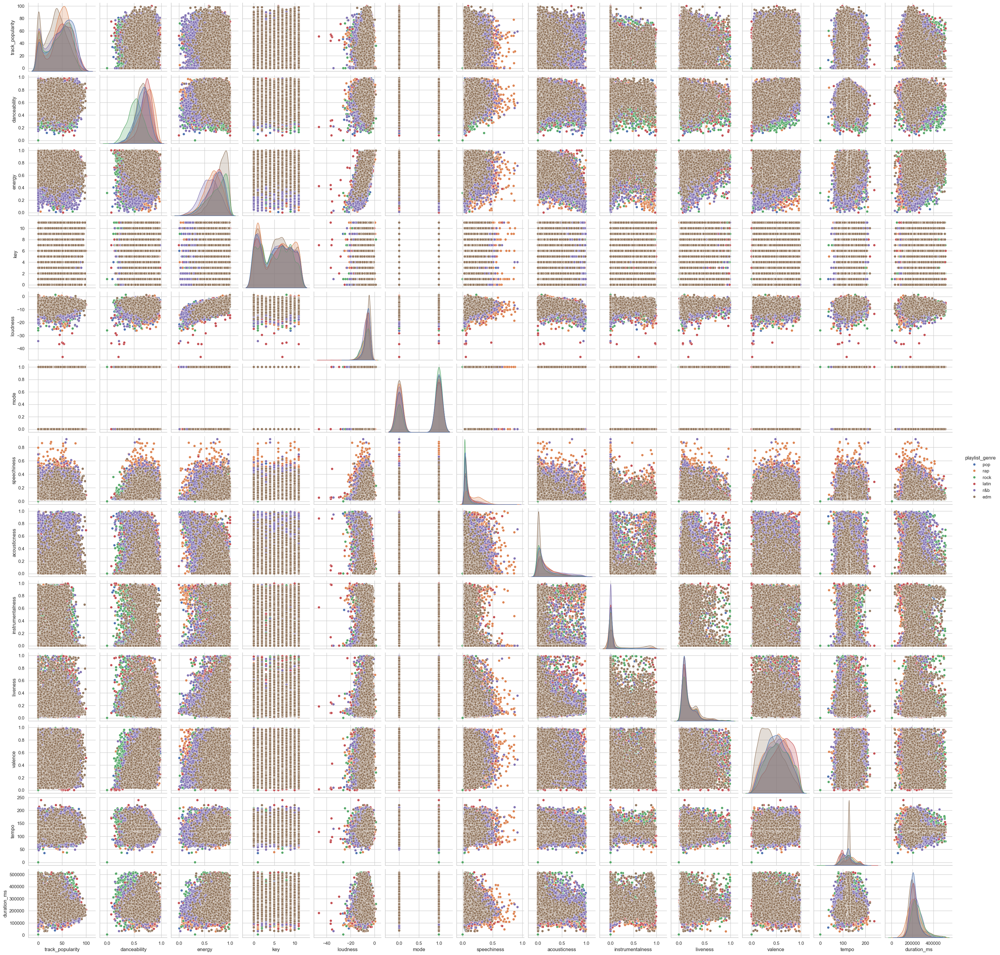

In [123]:
sns.pairplot(data = df, hue='playlist_genre')

## Step 4. Find coorelations (HeatMap)

<Axes: >

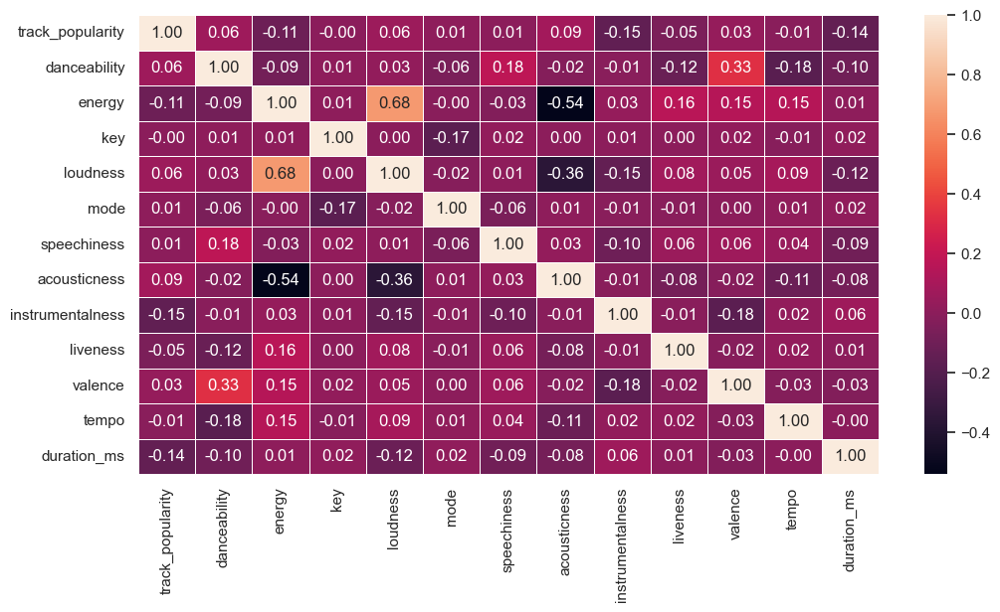

In [124]:
numeric_labels = df.select_dtypes(include=['int64', 'float64'])

plt.figure(figsize=(12,6))
sns.heatmap(data = numeric_labels.corr(), annot=True, fmt='.2f', linewidths=0.5)


## Step 5: Feature Engineering

**Add Labels:** 
    
    - song_age (2022 - release year)
    
    - duration_min  (ms to min) 1 s = 1,000ms; 1 min = 60 s;  1 min = 60,000 ms
    
    - vibe (energy * danceability)

In [125]:
df['track_album_release_date'].info() 

<class 'pandas.core.series.Series'>
Index: 32828 entries, 0 to 32832
Series name: track_album_release_date
Non-Null Count  Dtype         
--------------  -----         
30942 non-null  datetime64[ns]
dtypes: datetime64[ns](1)
memory usage: 512.9 KB


In [126]:
max_date = df['track_album_release_date'].max().year + 1

df['song_age'] = (max_date - df['track_album_release_date'].dt.year).fillna(0)
df['song_age'].head() 

0    2.0
1    2.0
2    2.0
3    2.0
4    2.0
Name: song_age, dtype: float64

In [127]:
df['duration_min'] = df['duration_ms'] / 60000
df['duration_min'].head()

0    3.245900
1    2.710000
2    2.943600
3    2.818217
4    3.150867
Name: duration_min, dtype: float64

In [128]:
df['vibe'] = df['energy'] * df['danceability']
df['vibe'].head()

0    0.685168
1    0.591690
2    0.628425
3    0.667740
4    0.541450
Name: vibe, dtype: float64

## Step 6. Encoding & Data Leakage

In [129]:
# Backup Data

backup_data = df[:]

#* Backup data save, Don't touch it!

In [130]:
backup_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 32828 entries, 0 to 32832
Data columns (total 26 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   track_id                  32828 non-null  object        
 1   track_name                32828 non-null  object        
 2   track_artist              32828 non-null  object        
 3   track_popularity          32828 non-null  int64         
 4   track_album_id            32828 non-null  object        
 5   track_album_name          32828 non-null  object        
 6   track_album_release_date  30942 non-null  datetime64[ns]
 7   playlist_name             32828 non-null  object        
 8   playlist_id               32828 non-null  object        
 9   playlist_genre            32828 non-null  object        
 10  playlist_subgenre         32828 non-null  object        
 11  danceability              32828 non-null  float64       
 12  energy                 

In [131]:
# df = backup_data

#### **I changed my mind, there is unnecessary data here**

In [132]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 32828 entries, 0 to 32832
Data columns (total 26 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   track_id                  32828 non-null  object        
 1   track_name                32828 non-null  object        
 2   track_artist              32828 non-null  object        
 3   track_popularity          32828 non-null  int64         
 4   track_album_id            32828 non-null  object        
 5   track_album_name          32828 non-null  object        
 6   track_album_release_date  30942 non-null  datetime64[ns]
 7   playlist_name             32828 non-null  object        
 8   playlist_id               32828 non-null  object        
 9   playlist_genre            32828 non-null  object        
 10  playlist_subgenre         32828 non-null  object        
 11  danceability              32828 non-null  float64       
 12  energy                 

In [133]:
print(df['playlist_subgenre'].unique())
print(df['playlist_subgenre'].nunique())

['dance pop' 'post-teen pop' 'electropop' 'indie poptimism' 'hip hop'
 'southern hip hop' 'gangster rap' 'trap' 'album rock' 'classic rock'
 'permanent wave' 'hard rock' 'tropical' 'latin pop' 'reggaeton'
 'latin hip hop' 'urban contemporary' 'hip pop' 'new jack swing'
 'neo soul' 'electro house' 'big room' 'pop edm'
 'progressive electro house']
24


In [134]:
labels_to_drop = ['track_id', 'track_name', 'track_artist', 'track_album_id', 'track_album_name', 'playlist_id', 'playlist_name', 'duration_ms', 'track_album_release_date']
df = df.drop(labels_to_drop, axis=1)
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 32828 entries, 0 to 32832
Data columns (total 17 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   track_popularity   32828 non-null  int64  
 1   playlist_genre     32828 non-null  object 
 2   playlist_subgenre  32828 non-null  object 
 3   danceability       32828 non-null  float64
 4   energy             32828 non-null  float64
 5   key                32828 non-null  int64  
 6   loudness           32828 non-null  float64
 7   mode               32828 non-null  int64  
 8   speechiness        32828 non-null  float64
 9   acousticness       32828 non-null  float64
 10  instrumentalness   32828 non-null  float64
 11  liveness           32828 non-null  float64
 12  valence            32828 non-null  float64
 13  tempo              32828 non-null  float64
 14  song_age           32828 non-null  float64
 15  duration_min       32828 non-null  float64
 16  vibe               32828 no

One-Hot Encoding

In [135]:
df = pd.get_dummies(df, columns=['playlist_genre'], prefix='g')
df = pd.get_dummies(df, columns=['playlist_subgenre'], prefix='subg')

In [136]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 32828 entries, 0 to 32832
Data columns (total 45 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   track_popularity                32828 non-null  int64  
 1   danceability                    32828 non-null  float64
 2   energy                          32828 non-null  float64
 3   key                             32828 non-null  int64  
 4   loudness                        32828 non-null  float64
 5   mode                            32828 non-null  int64  
 6   speechiness                     32828 non-null  float64
 7   acousticness                    32828 non-null  float64
 8   instrumentalness                32828 non-null  float64
 9   liveness                        32828 non-null  float64
 10  valence                         32828 non-null  float64
 11  tempo                           32828 non-null  float64
 12  song_age                        32828

## Step 6. Scaling & Train/Test Split

In [163]:
encoding_data = df[:]
df.to_csv('data/spotify_songs_ready.csv')

In [138]:
X = df.drop(['track_popularity'], axis=1)
y = df['track_popularity']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

In [139]:
scaler = StandardScaler()

X_train_scaler = scaler.fit_transform(X_train)
X_test_scaler = scaler.transform(X_test)

## Step 7. Creat multiple types of models

## 7.1 Linear Regression 

In [ ]:
from sklearn.linear_model import LinearRegression, SGDRegressor
from sklearn.metrics import mean_absolute_error, r2_score, accuracy_score

lr_model = LinearRegression()
lr_model.fit(X_train_scaler, y_train) 

y_pred_lr = lr_model.predict(X_test_scaler)

lr_MAE = mean_absolute_error(y_test, y_pred_lr)
lr_MAE

19.031548470015522

In [149]:
lr_r2 = r2_score(y_test, y_pred_lr)
lr_r2

0.1565317602430797

## 7.2 Random Forest Regression

In [146]:
from sklearn.ensemble import RandomForestRegressor

rf_model = RandomForestRegressor(n_estimators=150, random_state=42)
rf_model.fit(X_train_scaler, y_train)

y_pred_rf = rf_model.predict(X_test_scaler)

rf_MAE = mean_absolute_error(y_test, y_pred_rf)
rf_MAE

16.860125861851724

In [150]:
rf_r2 = r2_score(y_test, y_pred_lr)
rf_r2

0.1565317602430797

In [157]:
importance = rf_model.feature_importances_
feature_name = X.columns 

feature_important_df = pd.DataFrame({'feature': feature_name, 'importance': importance})
feature_important_df = feature_important_df.sort_values(by='importance', ascending=False)

feature_important_df.head(20)

,feature,importance
11,song_age,0.105896
3,loudness,0.076160
12,duration_min,0.072305
7,instrumentalness,0.071526
6,acousticness,0.067460
10,tempo,0.067139
5,speechiness,0.065431
9,valence,0.064933
1,energy,0.063900
8,liveness,0.063492


## 7.3 Support Vector Machine

In [158]:
from sklearn.svm import SVR

svr_model = SVR(kernel='rbf', C = 1.0, epsilon=0.1)
svr_model.fit(X_train_scaler, y_train)

y_pred_svr = svr_model.predict(X_test_scaler)

svr_MAE = mean_absolute_error(y_test, y_pred_svr)
svr_MAE

18.3688390173953

In [159]:
svr_r2 = r2_score(y_test, y_pred_svr)
svr_r2

0.1661918190893219

In [160]:
from sklearn.model_selection import GridSearchCV

svr = SVR()

param_grid = {
    'kernel': ['rbf', 'poly'],         
    'C': [0.1, 1, 10, 15],          
    'epsilon': [0.01, 0.1, 1],  
    'gamma': ['scale', 'auto']  
}

grid_search = GridSearchCV(
    estimator=svr, 
    param_grid=param_grid, 
    cv=5,                       
    scoring='neg_mean_absolute_error', 
    verbose=2,                  
    n_jobs=-1                   
)

grid_search.fit(X_train_scaler, y_train)

Fitting 5 folds for each of 48 candidates, totalling 240 fits


,"estimator estimator: estimator objectThis is assumed to implement the scikit-learn estimator interface.Either estimator needs to provide a ``score`` function,or ``scoring`` must be passed.",SVR()
,"param_grid param_grid: dict or list of dictionariesDictionary with parameters names (`str`) as keys and lists ofparameter settings to try as values, or a list of suchdictionaries, in which case the grids spanned by each dictionaryin the list are explored. This enables searching over any sequenceof parameter settings.","{'C': [0.1, 1, ...], 'epsilon': [0.01, 0.1, ...], 'gamma': ['scale', 'auto'], 'kernel': ['rbf', 'poly']}"
,"scoring scoring: str, callable, list, tuple or dict, default=NoneStrategy to evaluate the performance of the cross-validated model onthe test set.If `scoring` represents a single score, one can use:- a single string (see :ref:`scoring_string_names`);- a callable (see :ref:`scoring_callable`) that returns a single value;- `None`, the `estimator`'s :ref:`default evaluation criterion ` is used.If `scoring` represents multiple scores, one can use:- a list or tuple of unique strings;- a callable returning a dictionary where the keys are the metric names and the values are the metric scores;- a dictionary with metric names as keys and callables as values.See :ref:`multimetric_grid_search` for an example.",'neg_mean_absolute_error'
,"n_jobs n_jobs: int, default=NoneNumber of jobs to run in parallel.``None`` means 1 unless in a :obj:`joblib.parallel_backend` context.``-1`` means using all processors. See :term:`Glossary `for more details... versionchanged:: v0.20 `n_jobs` default changed from 1 to None",-1
,"refit refit: bool, str, or callable, default=TrueRefit an estimator using the best found parameters on the wholedataset.For multiple metric evaluation, this needs to be a `str` denoting thescorer that would be used to find the best parameters for refittingthe estimator at the end.Where there are considerations other than maximum score inchoosing a best estimator, ``refit`` can be set to a function whichreturns the selected ``best_index_`` given ``cv_results_``. In thatcase, the ``best_estimator_`` and ``best_params_`` will be setaccording to the returned ``best_index_`` while the ``best_score_``attribute will not be available.The refitted estimator is made available at the ``best_estimator_``attribute and permits using ``predict`` directly on this``GridSearchCV`` instance.Also for multiple metric evaluation, the attributes ``best_index_``,``best_score_`` and ``best_params_`` will only be available if``refit`` is set and all of them will be determined w.r.t this specificscorer.See ``scoring`` parameter to know more about multiple metricevaluation.See :ref:`sphx_glr_auto_examples_model_selection_plot_grid_search_digits.py`to see how to design a custom selection strategy using a callablevia `refit`.See :ref:`this example`for an example of how to use ``refit=callable`` to balance modelcomplexity and cross-validated score... versionchanged:: 0.20 Support for callable added.",True
,"cv cv: int, cross-validation generator or an iterable, default=NoneDetermines the cross-validation splitting strategy.Possible inputs for cv are:- None, to use the default 5-fold cross validation,- integer, to specify the number of folds in a `(Stratified)KFold`,- :term:`CV splitter`,- An iterable yielding (train, test) splits as arrays of indices.For integer/None inputs, if the estimator is a classifier and ``y`` iseither binary or multiclass, :class:`StratifiedKFold` is used. In allother cases, :class:`KFold` is used. These splitters are instantiatedwith `shuffle=False` so the splits will be the same across calls.Refer :ref:`User Guide ` for the variouscross-validation strategies that can be used here... versionchanged:: 0.22 ``cv`` default value if None changed from 3-fold to 5-fold.",5
,"verbose verbose: intControls the verbosity: the higher, the more messages.- >1 : the computation time for each fold and parameter candidate is displayed

In [161]:
best_model = grid_search.best_estimator_
best_model

,"kernel kernel: {'linear', 'poly', 'rbf', 'sigmoid', 'precomputed'} or callable, default='rbf'Specifies the kernel type to be used in the algorithm.If none is given, 'rbf' will be used. If a callable is given it isused to precompute the kernel matrix.For an intuitive visualization of different kernel typessee :ref:`sphx_glr_auto_examples_svm_plot_svm_regression.py`",'rbf'
,"degree degree: int, default=3Degree of the polynomial kernel function ('poly').Must be non-negative. Ignored by all other kernels.",3
,"gamma gamma: {'scale', 'auto'} or float, default='scale'Kernel coefficient for 'rbf', 'poly' and 'sigmoid'.- if ``gamma='scale'`` (default) is passed then it uses 1 / (n_features * X.var()) as value of gamma,- if 'auto', uses 1 / n_features- if float, must be non-negative... versionchanged:: 0.22 The default value of ``gamma`` changed from 'auto' to 'scale'.",'auto'
,"coef0 coef0: float, default=0.0Independent term in kernel function.It is only significant in 'poly' and 'sigmoid'.",0.0
,"tol tol: float, default=1e-3Tolerance for stopping criterion.",0.001
,"C C: float, default=1.0Regularization parameter. The strength of the regularization isinversely proportional to C. Must be strictly positive.The penalty is a squared l2. For an intuitive visualization of theeffects of scaling the regularization parameter C, see:ref:`sphx_glr_auto_examples_svm_plot_svm_scale_c.py`.",15
,"epsilon epsilon: float, default=0.1Epsilon in the epsilon-SVR model. It specifies the epsilon-tubewithin which no penalty is associated in the training loss functionwith points predicted within a distance epsilon from the actualvalue. Must be non-negative.",1
,"shrinking shrinking: bool, default=TrueWhether to use the shrinking heuristic.See the :ref:`User Guide `.",True
,"cache_size cache_size: float, default=200Specify the size of the kernel cache (in MB).",200
,"verbose verbose: bool, default=FalseEnable verbose output. Note that this setting takes advantage of aper-process runtime setting in libsvm that, if enabled, may not workproperly in a multithreaded context.",False
,"max_iter max_iter: int, default=-1Hard limit on iterations within solver, or -1 for no limit.",-1
